**1. Dishant Parikh - C0934360**</br>
**2. Opinderieet Kaur - C0937407**</br>
**3. Rohit Rajpoot - C0935925**</br>
**4. Sana Khan - C0937931**</br>
**5. Zoheb Siddiqui - C0933790**</br>

# Supermarket Dataset Analysis

The objective of this analysis is to uncover actionable insights from the **Supermarket Dataset** to optimize business strategies aimed at improving profitability, customer satisfaction, and operational efficiency. The dataset contains detailed information about supermarket transactions, including:

- **Invoice ID**: A unique identifier for each transaction or bill.  
- **Branch**: The specific supermarket branch where the transaction occurred.  
- **City**: The location of the supermarket branch.  
- **Customer Type**: The classification of customers (e.g., Member or Normal).  
- **Gender**: The gender of the customer making the purchase.  
- **Product Line**: The category of products purchased (e.g., Electronics, Groceries).  
- **Unit Price**: The price per unit of the product.  
- **Quantity**: The number of units purchased.  
- **Tax**: The tax amount applied to the transaction.  
- **Total Amount**: The total cost of the transaction, including tax.  
- **Payment Method**: The mode of payment used (e.g., Cash, Credit Card, E-wallet).  
- **Ratings**: The customer-provided rating for the transaction or service.  

## Key Objectives:

1. **Analyze Customer Behavior**:
   - Identify trends in purchasing patterns across different product lines, customer types, and payment methods.
   - Understand the impact of demographics (e.g., gender, city) on shopping preferences.

2. **Assess Business Performance**:
   - Examine revenue and sales distribution across branches and product lines.
   - Determine the correlation between customer ratings and product lines to identify strengths and weaknesses.

3. **Optimize Operations**:
   - Identify peak transaction times and days for better workforce allocation and inventory management.
   - Analyze sales variability across branches to recommend region-specific strategies.

This analysis will provide supermarket management with data-driven insights to make informed decisions and improve overall business performance.


In [84]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from textwrap import wrap
import plotly.express as px

In [2]:
df = pd.read_csv("Superstore_modified.csv")

In [3]:
df.head() # top 5 rows

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country/Region,City,...,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
0,1,US-2021-103800,03-01-2021,07-01-2021,Standard Class,DP-13000,NaN,Consumer,United States,Houston,...,77095,Central,OFF-PA-10000174,Office Supplies,Paper,"Message Book, Wirebound, Four 5 1/2"" X 4"" Form...",16.448,2,0.2,5.5512
1,2,US-2021-112326,04-01-2021,08-01-2021,Standard Class,PO-19195,NaN,Home Office,United States,Naperville,...,60540,Central,OFF-BI-10004094,Office Supplies,Binders,GBC Standard Plastic Binding Systems Combs,3.540,2,0.8,-5.4870
2,3,US-2021-112326,04-01-2021,08-01-2021,Standard Class,PO-19195,NaN,Home Office,United States,Naperville,...,60540,Central,OFF-LA-10003223,Office Supplies,Labels,Avery 508,11.784,3,0.2,4.2717
3,4,US-2021-112326,04-01-2021,08-01-2021,Standard Class,PO-19195,NaN,Home Office,United States,Naperville,...,60540,Central,OFF-ST-10002743,Office Supplies,Storage,SAFCO Boltless Steel Shelving,272.736,3,0.2,-64.7748
4,5,US-2021-141817,05-01-2021,12-01-2021,Standard Class,MB-18085,NaN,Consumer,United States,Philadelphia,...,19143,East,OFF-AR-10003478,Office Supplies,Art,Avery Hi-Liter EverBold Pen Style Fluorescent ...,19.536,3,0.2,4.8840


In [4]:
df.tail() # last 5 rows

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country/Region,City,...,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
10189,10190,US-2024-143259,30-12-2024,03-01-2025,Standard Class,PO-18865,NaN,Consumer,United States,New York City,...,10009,East,OFF-BI-10003684,Office Supplies,Binders,Wilson Jones Legal Size Ring Binders,52.776,3,0.2,19.7910
10190,10191,US-2024-115427,30-12-2024,03-01-2025,Standard Class,EB-13975,NaN,Corporate,United States,Fairfield,...,94533,West,OFF-BI-10004632,Office Supplies,Binders,GBC Binding covers,20.720,2,0.2,6.4750
10191,10192,US-2024-156720,30-12-2024,03-01-2025,Standard Class,JM-15580,Jill Matthias,Consumer,United States,Loveland,...,80538,West,OFF-FA-10003472,Office Supplies,Fasteners,Bagged Rubber Bands,3.024,3,0.2,-0.6048
10192,10193,US-2024-143259,30-12-2024,03-01-2025,Standard Class,PO-18865,NaN,Consumer,United States,New York City,...,10009,East,TEC-PH-10004774,Technology,Phones,Gear Head AU3700S Headset,90.930,7,0.0,2.7279
10193,10194,CA-2024-143500,30-12-2024,03-01-2025,Standard Class,HO-15230,Harry Olson,Consumer,Canada,Charlottetown,...,C0A,East,OFF-BI-10004040,Office Supplies,Binders,Wilson Jones Impact Binders,3.024,3,0.2,-0.6048


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10194 entries, 0 to 10193
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Row ID          10194 non-null  int64  
 1   Order ID        10194 non-null  object 
 2   Order Date      10194 non-null  object 
 3   Ship Date       10194 non-null  object 
 4   Ship Mode       10194 non-null  object 
 5   Customer ID     10194 non-null  object 
 6   Customer Name   2039 non-null   object 
 7   Segment         10194 non-null  object 
 8   Country/Region  10194 non-null  object 
 9   City            10194 non-null  object 
 10  State/Province  10194 non-null  object 
 11  Postal Code     10194 non-null  object 
 12  Region          10194 non-null  object 
 13  Product ID      10194 non-null  object 
 14  Category        10194 non-null  object 
 15  Sub-Category    10194 non-null  object 
 16  Product Name    10194 non-null  object 
 17  Sales           10194 non-null 

In [10]:
df.dtypes # column data types

Row ID              int64
Order ID           object
Order Date         object
Ship Date          object
Ship Mode          object
Customer ID        object
Customer Name      object
Segment            object
Country/Region     object
City               object
State/Province     object
Postal Code        object
Region             object
Product ID         object
Category           object
Sub-Category       object
Product Name       object
Sales             float64
Quantity            int64
Discount          float64
Profit            float64
dtype: object

In [6]:
df.describe()

,Row ID,Sales,Quantity,Discount,Profit
count,10194.000000,10194.000000,10194.000000,10194.000000,10194.000000
mean,5097.500000,228.225854,3.791838,0.155385,28.673417
std,2942.898656,619.906839,2.228317,0.206249,232.465115
min,1.000000,0.444000,1.000000,0.000000,-6599.978000
25%,2549.250000,17.220000,2.000000,0.000000,1.760800
50%,5097.500000,53.910000,3.000000,0.200000,8.690000
75%,7645.750000,209.500000,5.000000,0.200000,29.297925
max,10194.000000,22638.480000,14.000000,0.800000,8399.976000


In [9]:
df.nunique() # get count of unique values

Row ID            10194
Order ID           5111
Order Date         1242
Ship Date          1338
Ship Mode             4
Customer ID         804
Customer Name       701
Segment               3
Country/Region        2
City                542
State/Province       59
Postal Code         654
Region                4
Product ID         1862
Category              3
Sub-Category         17
Product Name       1849
Sales              5837
Quantity             14
Discount             12
Profit             7334
dtype: int64

In [7]:
df.isnull().sum() # check for null values

Row ID               0
Order ID             0
Order Date           0
Ship Date            0
Ship Mode            0
Customer ID          0
Customer Name     8155
Segment              0
Country/Region       0
City                 0
State/Province       0
Postal Code          0
Region               0
Product ID           0
Category             0
Sub-Category         0
Product Name         0
Sales                0
Quantity             0
Discount             0
Profit               0
dtype: int64

#### Looks like we have some null values in the 'Customer Name' column

In [8]:
df.isnull().mean()

Row ID            0.00000
Order ID          0.00000
Order Date        0.00000
Ship Date         0.00000
Ship Mode         0.00000
Customer ID       0.00000
Customer Name     0.79998
Segment           0.00000
Country/Region    0.00000
City              0.00000
State/Province    0.00000
Postal Code       0.00000
Region            0.00000
Product ID        0.00000
Category          0.00000
Sub-Category      0.00000
Product Name      0.00000
Sales             0.00000
Quantity          0.00000
Discount          0.00000
Profit            0.00000
dtype: float64

#### As we can see that almost 79% of the data in Customer Name column contains null values thus it makes sense to drop that column

In [11]:
categorical_columns = df.select_dtypes(include=['object', 'category']).columns

In [12]:
categorical_columns # show categorical data

Index(['Order ID', 'Order Date', 'Ship Date', 'Ship Mode', 'Customer ID',
       'Customer Name', 'Segment', 'Country/Region', 'City', 'State/Province',
       'Postal Code', 'Region', 'Product ID', 'Category', 'Sub-Category',
       'Product Name'],
      dtype='object')

# Data Cleaning and Preprocessing

#### Dropping columns which are of no use or have a lot of null values in them

In [14]:
df.drop(columns = ['Row ID','Order ID','Customer Name','Postal Code'],inplace = True)

In [15]:
df.head()

,Order Date,Ship Date,Ship Mode,Customer ID,Segment,Country/Region,City,State/Province,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
0,03-01-2021,07-01-2021,Standard Class,DP-13000,Consumer,United States,Houston,Texas,Central,OFF-PA-10000174,Office Supplies,Paper,"Message Book, Wirebound, Four 5 1/2"" X 4"" Form...",16.448,2,0.2,5.5512
1,04-01-2021,08-01-2021,Standard Class,PO-19195,Home Office,United States,Naperville,Illinois,Central,OFF-BI-10004094,Office Supplies,Binders,GBC Standard Plastic Binding Systems Combs,3.540,2,0.8,-5.4870
2,04-01-2021,08-01-2021,Standard Class,PO-19195,Home Office,United States,Naperville,Illinois,Central,OFF-LA-10003223,Office Supplies,Labels,Avery 508,11.784,3,0.2,4.2717
3,04-01-2021,08-01-2021,Standard Class,PO-19195,Home Office,United States,Naperville,Illinois,Central,OFF-ST-10002743,Office Supplies,Storage,SAFCO Boltless Steel Shelving,272.736,3,0.2,-64.7748
4,05-01-2021,12-01-2021,Standard Class,MB-18085,Consumer,United States,Philadelphia,Pennsylvania,East,OFF-AR-10003478,Office Supplies,Art,Avery Hi-Liter EverBold Pen Style Fluorescent ...,19.536,3,0.2,4.8840


### Converting date columns to datetime format 

In [16]:
df['Order Date'] = pd.to_datetime(df['Order Date'], dayfirst=True)
df['Ship Date'] = pd.to_datetime(df['Ship Date'], dayfirst=True)

In [17]:
df['Shipping Duration'] = (pd.to_datetime(df['Ship Date']) - pd.to_datetime(df['Order Date'])).dt.days

In [18]:
df['Profit Margin'] = (df['Profit'] / df['Sales']) * 100

In [19]:
df['Order Year'] = df['Order Date'].dt.year
df['Order Month'] = df['Order Date'].dt.month

In [20]:
df.head()

,Order Date,Ship Date,Ship Mode,Customer ID,Segment,Country/Region,City,State/Province,Region,Product ID,...,Sub-Category,Product Name,Sales,Quantity,Discount,Profit,Shipping Duration,Profit Margin,Order Year,Order Month
0,2021-01-03,2021-01-07,Standard Class,DP-13000,Consumer,United States,Houston,Texas,Central,OFF-PA-10000174,...,Paper,"Message Book, Wirebound, Four 5 1/2"" X 4"" Form...",16.448,2,0.2,5.5512,4,33.75,2021,1
1,2021-01-04,2021-01-08,Standard Class,PO-19195,Home Office,United States,Naperville,Illinois,Central,OFF-BI-10004094,...,Binders,GBC Standard Plastic Binding Systems Combs,3.540,2,0.8,-5.4870,4,-155.00,2021,1
2,2021-01-04,2021-01-08,Standard Class,PO-19195,Home Office,United States,Naperville,Illinois,Central,OFF-LA-10003223,...,Labels,Avery 508,11.784,3,0.2,4.2717,4,36.25,2021,1
3,2021-01-04,2021-01-08,Standard Class,PO-19195,Home Office,United States,Naperville,Illinois,Central,OFF-ST-10002743,...,Storage,SAFCO Boltless Steel Shelving,272.736,3,0.2,-64.7748,4,-23.75,2021,1
4,2021-01-05,2021-01-12,Standard Class,MB-18085,Consumer,United States,Philadelphia,Pennsylvania,East,OFF-AR-10003478,...,Art,Avery Hi-Liter EverBold Pen Style Fluorescent ...,19.536,3,0.2,4.8840,7,25.00,2021,1


## One hot encoding

In [21]:
# One-hot encoding
df = pd.get_dummies(df, columns=['Ship Mode', 'Segment', 'Region', 'Category', 'Sub-Category'], drop_first=True)

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10194 entries, 0 to 10193
Data columns (total 42 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Order Date                10194 non-null  datetime64[ns]
 1   Ship Date                 10194 non-null  datetime64[ns]
 2   Customer ID               10194 non-null  object        
 3   Country/Region            10194 non-null  object        
 4   City                      10194 non-null  object        
 5   State/Province            10194 non-null  object        
 6   Product ID                10194 non-null  object        
 7   Product Name              10194 non-null  object        
 8   Sales                     10194 non-null  float64       
 9   Quantity                  10194 non-null  int64         
 10  Discount                  10194 non-null  float64       
 11  Profit                    10194 non-null  float64       
 12  Shipping Duration 

## Min-max scaling

In [23]:
# Columns to scale
numerical_cols = ['Sales', 'Profit', 'Discount', 'Shipping Duration', 'Profit Margin']

# Apply Min-Max scaling
scaler = MinMaxScaler()
df[numerical_cols] = scaler.fit_transform(df[numerical_cols])

# Check scaled values
print(df[numerical_cols].head())

      Sales    Profit  Discount  Shipping Duration  Profit Margin
0  0.000707  0.440370      0.25           0.363636       0.950000
1  0.000137  0.439634      1.00           0.363636       0.369231
2  0.000501  0.440285      0.25           0.363636       0.957692
3  0.012028  0.435682      0.25           0.363636       0.773077
4  0.000843  0.440325      0.25           0.636364       0.923077


In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10194 entries, 0 to 10193
Data columns (total 42 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Order Date                10194 non-null  datetime64[ns]
 1   Ship Date                 10194 non-null  datetime64[ns]
 2   Customer ID               10194 non-null  object        
 3   Country/Region            10194 non-null  object        
 4   City                      10194 non-null  object        
 5   State/Province            10194 non-null  object        
 6   Product ID                10194 non-null  object        
 7   Product Name              10194 non-null  object        
 8   Sales                     10194 non-null  float64       
 9   Quantity                  10194 non-null  int64         
 10  Discount                  10194 non-null  float64       
 11  Profit                    10194 non-null  float64       
 12  Shipping Duration 

# Exploratory Data Analysis (EDA) 

In [25]:
df.describe()

,Sales,Quantity,Discount,Profit,Shipping Duration,Profit Margin,Order Year,Order Month,Ship Mode_Same Day,Ship Mode_Second Class,...,Sub-Category_Envelopes,Sub-Category_Fasteners,Sub-Category_Furnishings,Sub-Category_Labels,Sub-Category_Machines,Sub-Category_Paper,Sub-Category_Phones,Sub-Category_Storage,Sub-Category_Supplies,Sub-Category_Tables
count,10194.000000,10194.000000,10194.000000,10194.000000,10194.000000,10194.000000,10194.000000,10194.000000,10194.000000,10194.000000,...,10194.000000,10194.000000,10194.00000,10194.000000,10194.000000,10194.000000,10194.000000,10194.000000,10194.000000,10194.000000
mean,0.010062,3.791838,0.194231,0.441911,0.360167,0.883759,2022.720129,7.811850,0.053659,0.194134,...,0.025113,0.022464,0.09898,0.036100,0.011477,0.135766,0.088582,0.083971,0.018835,0.031980
std,0.027383,2.228317,0.257811,0.015498,0.158555,0.143043,1.125611,3.295915,0.225355,0.395552,...,0.156475,0.148195,0.29865,0.186547,0.106521,0.342557,0.284153,0.277358,0.135947,0.175954
min,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,2021.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000741,2.000000,0.000000,0.440117,0.272727,0.869231,2022.000000,5.000000,0.000000,0.000000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.002362,3.000000,0.250000,0.440579,0.363636,0.929231,2023.000000,9.000000,0.000000,0.000000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.009235,5.000000,0.250000,0.441953,0.454545,0.957692,2024.000000,11.000000,0.000000,0.000000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,14.000000,1.000000,1.000000,1.000000,1.000000,2024.000000,12.000000,1.000000,1.000000,...,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### Correlation Heatmap

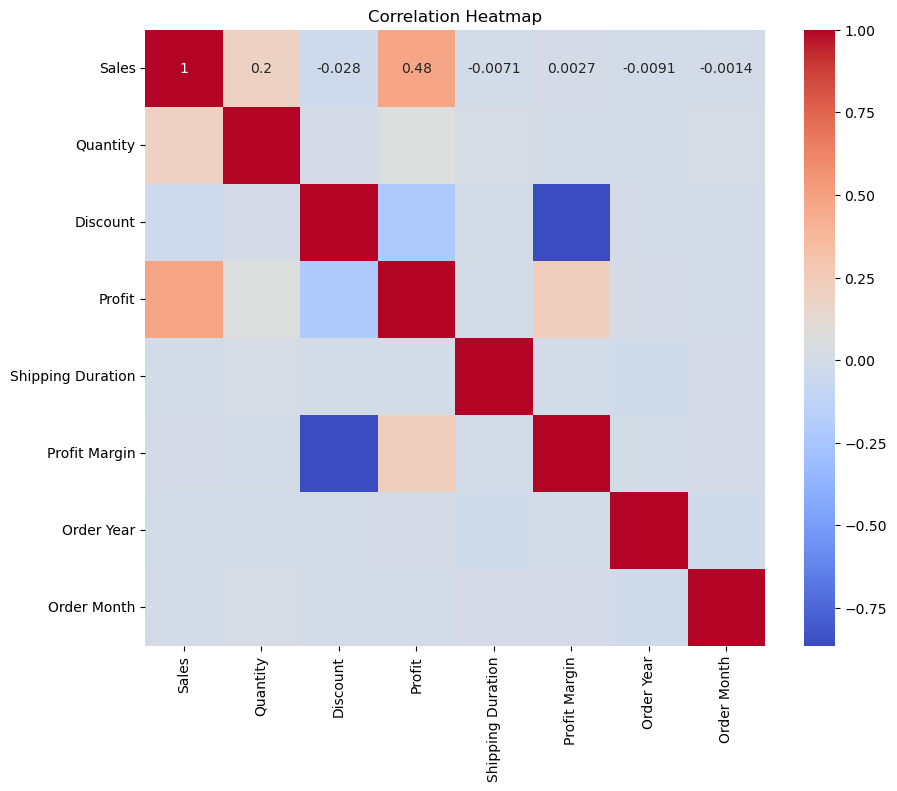

In [26]:
# Select only numeric columns
numeric_data = df.select_dtypes(include=['float64', 'int64'])

# Plot the correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(numeric_data.corr(), annot=True, cmap="coolwarm")
plt.title("Correlation Heatmap")
plt.show()


**Sales and Profit Correlation (0.48):**
Sales drive profitability significantly but not entirely, indicating room to optimize profit generation from existing sales.

**Discount and Profit Margin (-0.86):**
High discounts heavily reduce profit margins, negatively impacting profitability. Discount strategies should be carefully managed.

**Sales and Discount (-0.028):**
Discounts do not strongly influence sales, suggesting customers are driven by factors beyond price cuts.

**Shipping Duration:**
Minimal correlation with other variables suggests it does not significantly impact sales or profitability but maintaining efficiency can aid customer satisfaction.

**Conclusion:**
Focus on discount optimization and strategies to maximize profit margins while ensuring operational efficiency.

In [67]:
def wrap_labels(labels, width=15):
    return ['\n'.join(wrap(label, width)) for label in labels]

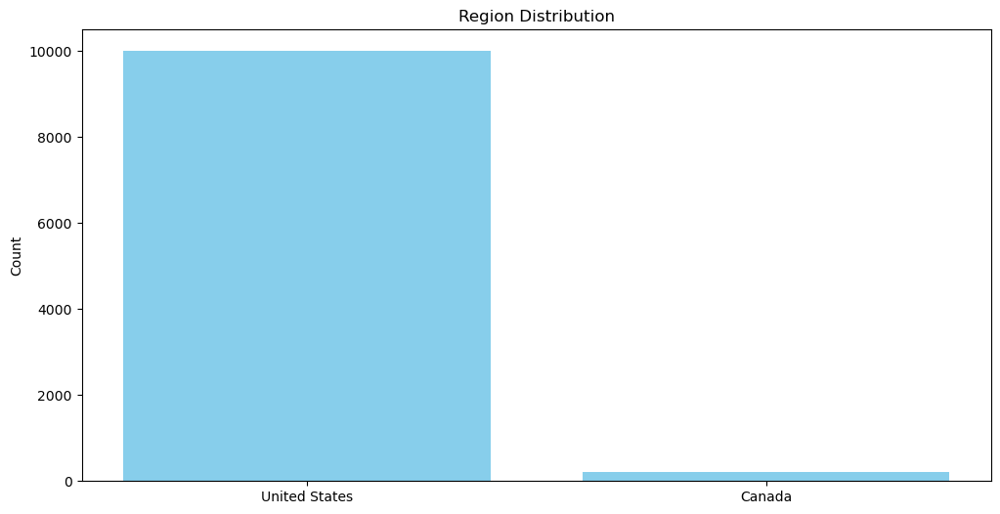

In [93]:
region_counts = df['Country/Region'].value_counts()

# Wrapping the region names
wrapped_labels = wrap_labels(region_counts.index, width=15)

# Plotting
plt.figure(figsize=(12, 6))
plt.bar(wrapped_labels, region_counts, color='skyblue')
plt.title("Region Distribution")
plt.ylabel("Count")
plt.show()

**Dominance of the United States:**

- The majority of the sales and operations are concentrated in the United States.
- Accounts for almost all transactions.

**Limited Presence in Canada:**

- Canada has a significantly smaller contribution compared to the United States.
- Indicates a limited market share or operational focus in that region.

**Conclusion:**

- The business is heavily US-centric.
- Expanding operations or targeting growth strategies in Canada could diversify and increase the customer base.

In [28]:
df.columns

Index(['Order Date', 'Ship Date', 'Customer ID', 'Country/Region', 'City',
       'State/Province', 'Product ID', 'Product Name', 'Sales', 'Quantity',
       'Discount', 'Profit', 'Shipping Duration', 'Profit Margin',
       'Order Year', 'Order Month', 'Ship Mode_Same Day',
       'Ship Mode_Second Class', 'Ship Mode_Standard Class',
       'Segment_Corporate', 'Segment_Home Office', 'Region_East',
       'Region_South', 'Region_West', 'Category_Office Supplies',
       'Category_Technology', 'Sub-Category_Appliances', 'Sub-Category_Art',
       'Sub-Category_Binders', 'Sub-Category_Bookcases', 'Sub-Category_Chairs',
       'Sub-Category_Copiers', 'Sub-Category_Envelopes',
       'Sub-Category_Fasteners', 'Sub-Category_Furnishings',
       'Sub-Category_Labels', 'Sub-Category_Machines', 'Sub-Category_Paper',
       'Sub-Category_Phones', 'Sub-Category_Storage', 'Sub-Category_Supplies',
       'Sub-Category_Tables'],
      dtype='object')

### Histogram for Numerical Variables

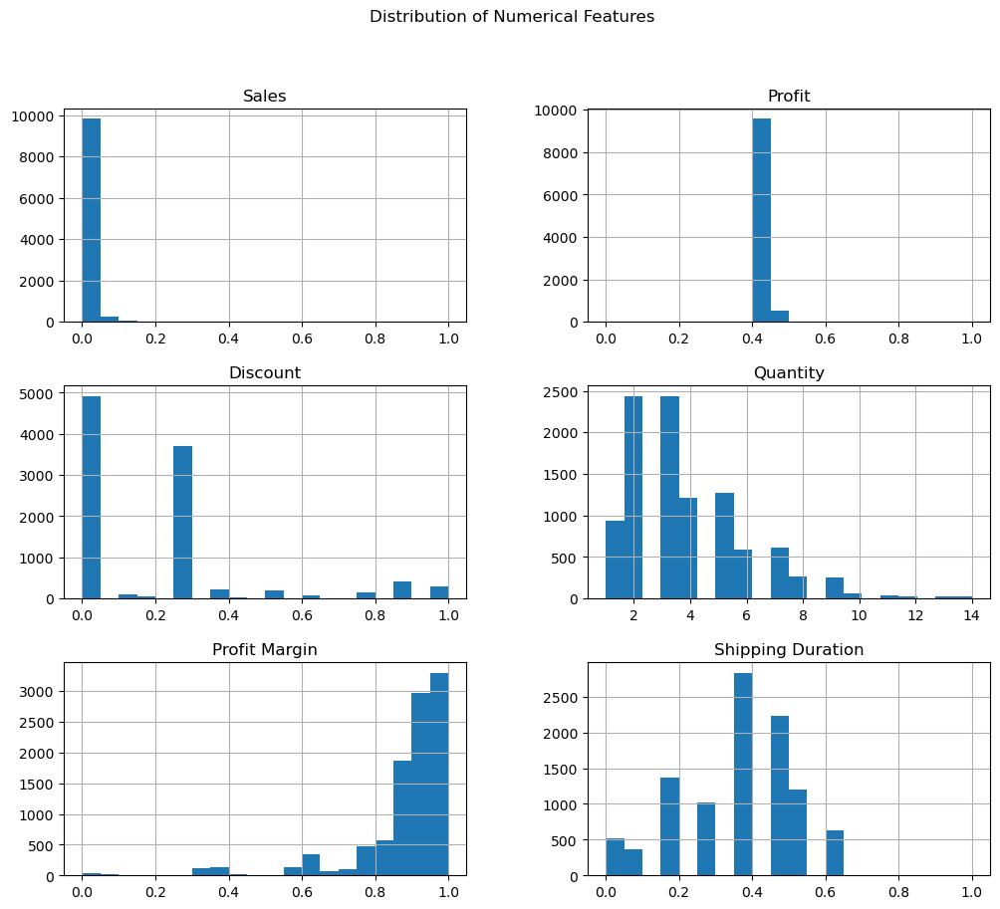

In [29]:
# Histograms to Check Distributions
df[['Sales', 'Profit', 'Discount', 'Quantity', 'Profit Margin', 'Shipping Duration']].hist(bins=20, figsize=(12, 10))
plt.suptitle("Distribution of Numerical Features")
plt.show()



**Sales and Profit:**

- Both are heavily skewed towards lower values.
  - Indicates that a majority of transactions involve smaller sales and profit amounts.
  - A few high-value transactions drive the overall metrics.

**Discount:**

- Most discounts are concentrated in lower ranges.
- Very few instances of high discounts.
  - Suggests controlled discounting strategies.

**Quantity:**

- The majority of orders involve small quantities (2–5 items).
- Bulk orders are rare.

**Profit Margin:**

- A significant portion of transactions have high profit margins.
  - This is a positive sign for operational efficiency.

**Shipping Duration:**

- Shipping durations are mostly concentrated around shorter times (0.4–0.6).
  - Indicates efficient logistics.

**Conclusion:**

- The business focuses on smaller transactions with efficient logistics.
- Controlled discounts help maintain high profit margins.
- Strategies for increasing the frequency of high-value orders could boost overall sales and profits.

### Boxplots for Outliers

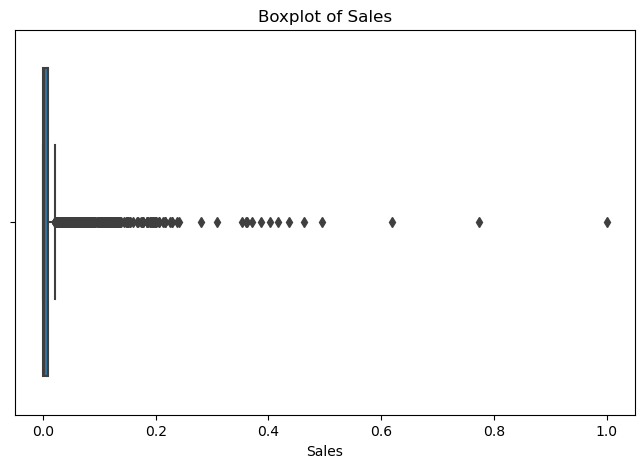

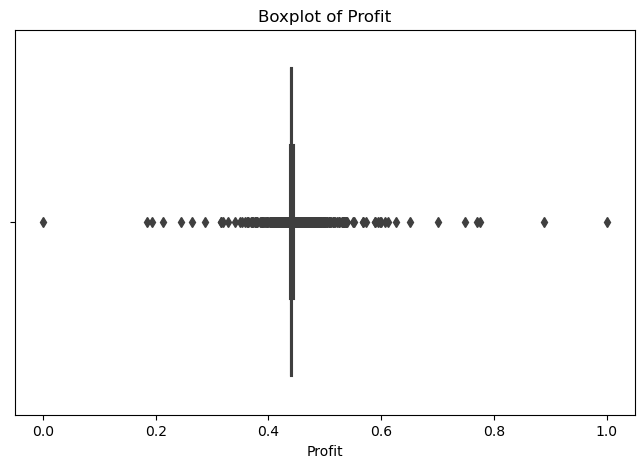

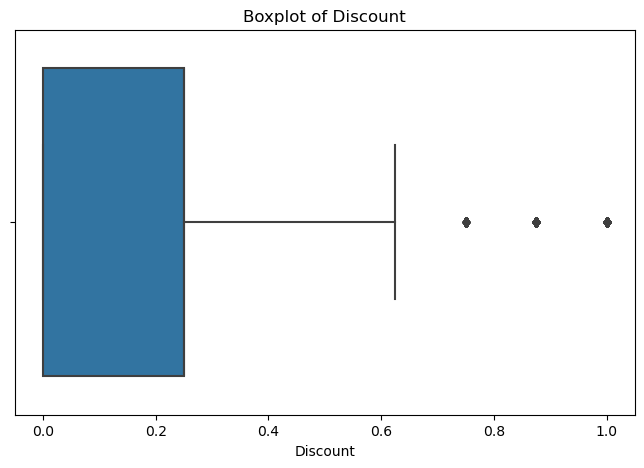

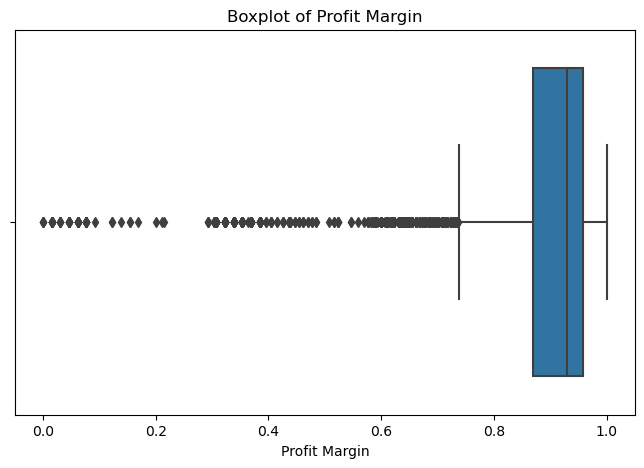

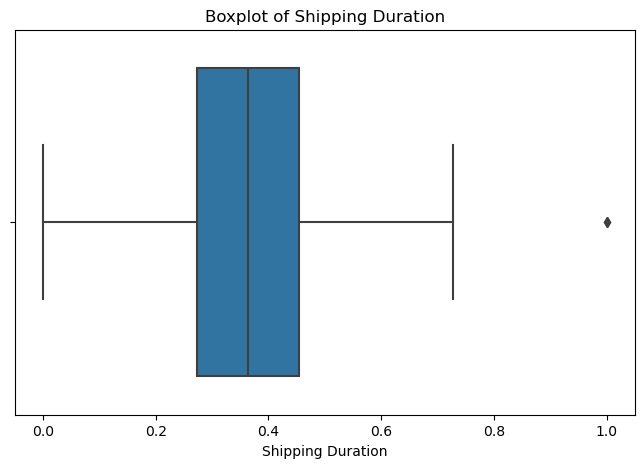

In [30]:
# List of numerical columns
numerical_cols = ['Sales', 'Profit', 'Discount', 'Profit Margin', 'Shipping Duration']

# Loop through each column and create a boxplot
for col in numerical_cols:
    plt.figure(figsize=(8, 5))
    sns.boxplot(x=df[col])
    plt.title(f"Boxplot of {col}")
    plt.xlabel(col)
    plt.show()


**1. Boxplot of Sales**

**Insights:**

- The majority of sales values are concentrated in a narrow range near the lower end.
- Several outliers indicate high-value transactions.
  - Outliers represent a small number of significant sales contributing disproportionately to overall revenue.


---

**2. Boxplot of Profit**

**Insights:**

- Profit distribution is heavily concentrated around a central range.
- Many outliers exist, both on the positive and negative ends.
  - Negative outliers suggest some transactions result in losses, likely due to high discounts or other costs.


---

**3. Boxplot of Discount**

**Insights:**

- Most discounts are within a controlled range of 0–0.2.
- Few high-discount outliers are present.
  - Controlled discounting helps maintain profitability, but outliers may indicate promotional strategies.


---

**4. Boxplot of Profit Margin**

**Insights:**

- The majority of transactions have high profit margins.
- Many low-margin outliers exist.
  - High profit margins suggest operational efficiency, while outliers may stem from aggressive discounting.


---

**5. Boxplot of Shipping Duration**

**Insights:**

- Shipping duration is tightly clustered around the mean.
- Minimal outliers are observed, indicating efficient logistics.

---

**Conclusion:**

- Outliers in sales, profit, and discounts highlight areas for strategic review.
- Consistent shipping duration and high profit margins indicate operational strengths.


### Time-Based Analysis

In [31]:
df['Order Year'] = pd.to_datetime(df['Order Date']).dt.year
df['Order Month'] = pd.to_datetime(df['Order Date']).dt.month

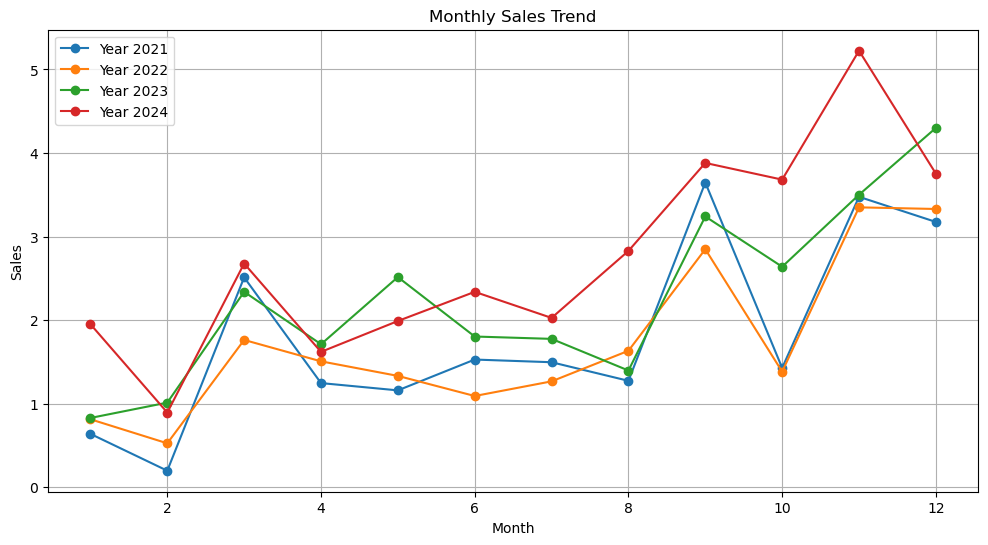

In [32]:
# Monthly Sales Trend
monthly_sales = df.groupby(['Order Year', 'Order Month'])['Sales'].sum().reset_index()

plt.figure(figsize=(12, 6))
for year in monthly_sales['Order Year'].unique():
    subset = monthly_sales[monthly_sales['Order Year'] == year]
    plt.plot(subset['Order Month'], subset['Sales'], marker='o', label=f"Year {year}")
plt.title("Monthly Sales Trend")
plt.xlabel("Month")
plt.ylabel("Sales")
plt.legend()
plt.grid()
plt.show()



**Sales Seasonality:**

- Sales exhibit a clear upward trend from mid-year (around month 7) to the end of the year across all years.
- Peaks in sales are consistently observed in:
  - **October (month 10)** 
  - **December (month 12)** 
    - Likely due to holiday seasons or end-of-year promotions.

---

**Yearly Variations:**

- **2024:** Shows a stronger sales trend compared to previous years, indicating potential growth or successful strategies.
- **2021 and 2022:** Have relatively flatter trends with lower overall sales compared to **2023** and **2024**.

---

**Slow Start in Early Months:**

- Sales are consistently lower in the first quarter (**January to March**) for all years.
  - Suggests reduced customer activity during these months.

---

**Conclusion:**

- Focus marketing and promotional efforts during high-performing months like **October** and **December** to maximize sales.
- Explore opportunities to boost sales in the first quarter to reduce seasonality impacts.
- Leverage **2024's** strong growth trend for expansion strategies.


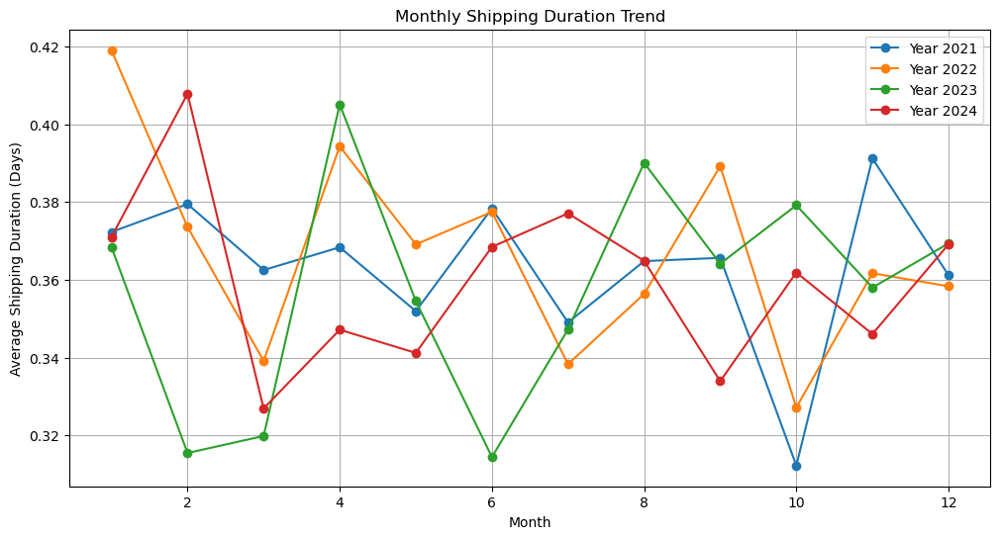

In [33]:
# Shipping Duration Over Time
monthly_shipping = df.groupby(['Order Year', 'Order Month'])['Shipping Duration'].mean().reset_index()

plt.figure(figsize=(12, 6))
for year in monthly_shipping['Order Year'].unique():
    subset = monthly_shipping[monthly_shipping['Order Year'] == year]
    plt.plot(subset['Order Month'], subset['Shipping Duration'], marker='o', label=f"Year {year}")
plt.title("Monthly Shipping Duration Trend")
plt.xlabel("Month")
plt.ylabel("Average Shipping Duration (Days)")
plt.legend()
plt.grid()
plt.show()


**Consistent Average Shipping Duration:**

- Across all years, the average shipping duration fluctuates within a narrow range (approximately **0.32 to 0.42 days**).
  - Indicates an overall efficient and stable logistics system.

---

**Monthly Variations:**

- Spikes in shipping duration are observed during:
  - **February**, **June**, and **October** in some years.
    - Suggests occasional delays or increased order volumes.
- Drops in shipping duration, particularly in:
  - **March** and **November**.
    - Indicates improved efficiencies or reduced workloads in these periods.

---

**Yearly Trends:**

- **2024** shows more consistent shipping times.
  - Suggests improvements in logistics or better demand forecasting compared to earlier years.

---

**Conclusion:**

- Shipping durations are largely efficient and consistent.
- Focus on identifying causes of occasional spikes in specific months (**e.g., February and October**) to further optimize the logistics system.
- Leveraging these insights can improve customer satisfaction.


## Regional Analysis

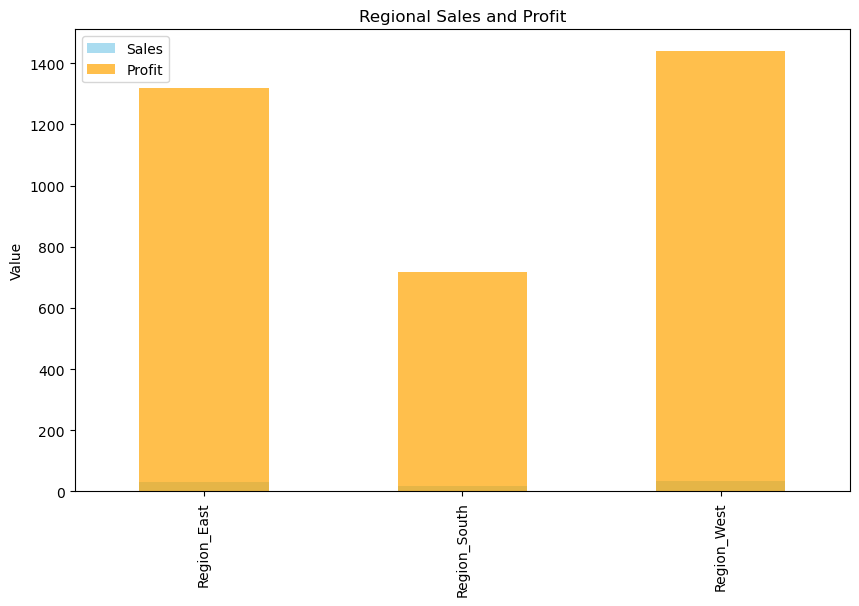

In [34]:
# Bar Plot for Regional Sales and Profit
regional_data = df[['Region_East', 'Region_South', 'Region_West']].multiply(df['Sales'], axis="index").sum()
regional_profit = df[['Region_East', 'Region_South', 'Region_West']].multiply(df['Profit'], axis="index").sum()

plt.figure(figsize=(10, 6))
regional_data.plot(kind='bar', color='skyblue', label='Sales', alpha=0.7)
regional_profit.plot(kind='bar', color='orange', label='Profit', alpha=0.7)
plt.title("Regional Sales and Profit")
plt.ylabel("Value")
plt.legend()
plt.show()


**Regional Sales Performance:**

- The **East** and **West** regions lead in sales and profits.
  - Shows strong market presence and operational efficiency.
- The **South** region lags behind in both metrics.
  - Indicates a potential area for improvement or limited market activity.

---

**Profitability Across Regions:**

- Profits closely mirror sales in each region.
  - Suggests consistent profit margins across the board.
- Both the **East** and **West** regions outperform in profitability.
  - Likely due to higher sales volumes or better cost management.

---

**Conclusion:**

- Focus on strengthening operations in the **South** region to increase market share and sales.
- Continue leveraging the strong performance in the **East** and **West** for sustained growth.


## Product Category Analysis

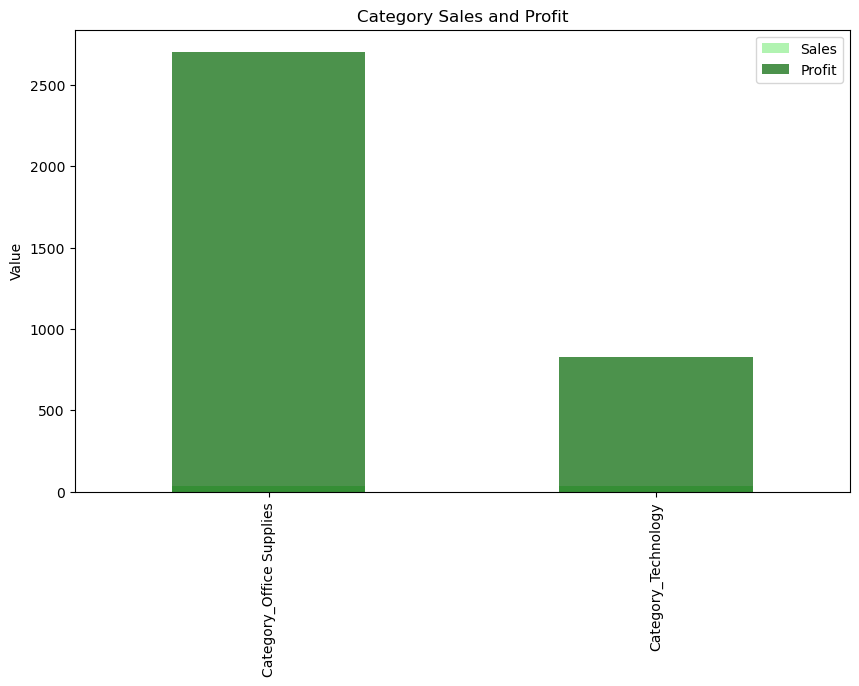

In [35]:
#Sales and Profit by Category
category_data = df[['Category_Office Supplies', 'Category_Technology']].multiply(df['Sales'], axis="index").sum()
category_profit = df[['Category_Office Supplies', 'Category_Technology']].multiply(df['Profit'], axis="index").sum()

plt.figure(figsize=(10, 6))
category_data.plot(kind='bar', color='lightgreen', label='Sales', alpha=0.7)
category_profit.plot(kind='bar', color='darkgreen', label='Profit', alpha=0.7)
plt.title("Category Sales and Profit")
plt.ylabel("Value")
plt.legend()
plt.show()


**Category Sales Performance:**

- **Office Supplies** dominate sales.
  - Contribute significantly more compared to Technology products.
  - Indicates a larger demand or higher transaction frequency for Office Supplies.

---

**Profit Contribution:**

- Profits align with sales trends, with **Office Supplies** leading.
  - However, the profit margin for **Technology** might still be significant on a per-unit basis.

---

**Conclusion:**

- Leverage the strong performance of **Office Supplies** to maintain consistent revenue.
- Focus on boosting **Technology** sales through targeted marketing or bundling strategies to improve its overall contribution to sales and profit.

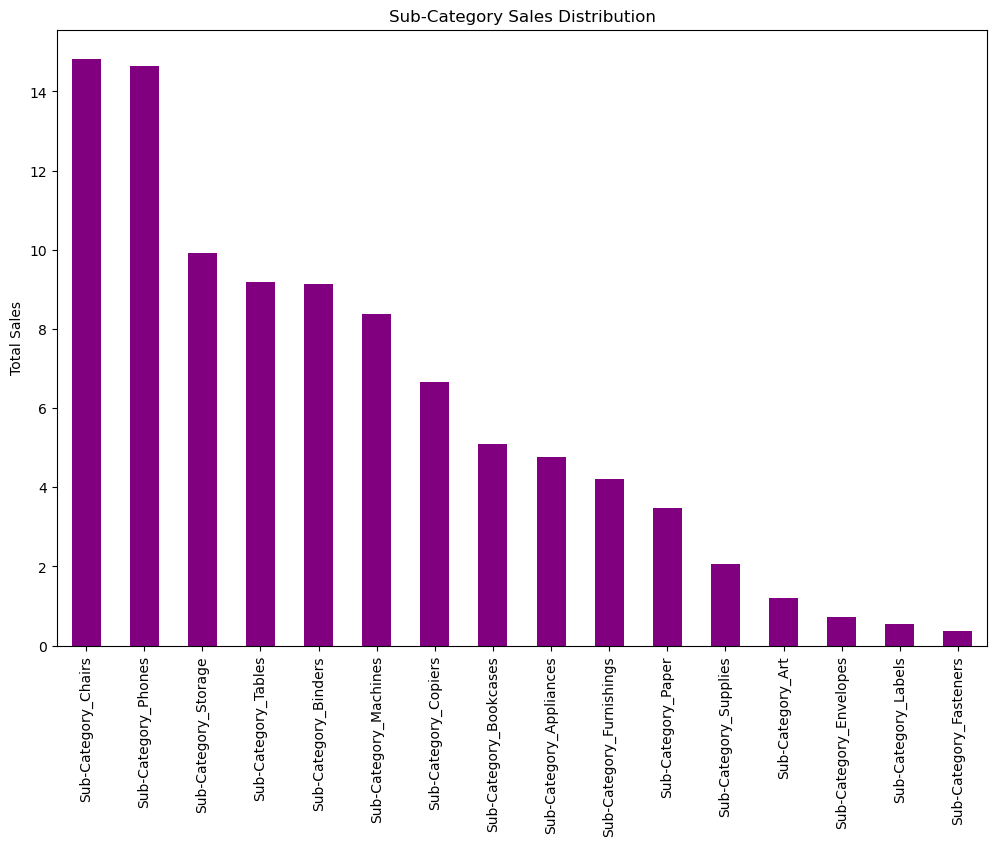

In [36]:
#Sub-Category Sales Distribution
sub_category_sales = df.filter(like='Sub-Category_').multiply(df['Sales'], axis="index").sum().sort_values(ascending=False)

plt.figure(figsize=(12, 8))
sub_category_sales.plot(kind='bar', color='purple', title="Sub-Category Sales Distribution")
plt.ylabel("Total Sales")
plt.show()


**Top Performing Sub-Categories:**

- **Chairs**, **Phones**, and **Storage** are the highest-grossing sub-categories.
  - Indicate strong demand and popularity.
  - Should be prioritized for inventory management and promotional campaigns to sustain high sales.

---

**Mid-Level Performers:**

- Sub-categories like **Tables**, **Binders**, and **Machines** contribute moderately to sales.
  - Potential to boost their performance through targeted marketing or bundling with top categories.

---

**Low Performing Sub-Categories:**

- **Labels**, **Envelopes**, and **Fasteners** generate the least sales.
  - Suggest lower customer demand or limited market focus.
  - Could be reviewed for potential discontinuation or repositioning.

---

**Conclusion:**

- Focus on high-performing sub-categories to maintain sales momentum.
- Explore strategies to increase demand for mid-level performers.
- Review the viability of low-performing sub-categories for optimization.

## Discount Impact Analysis

In [37]:
#Scatter Plot: Discount vs. Profit

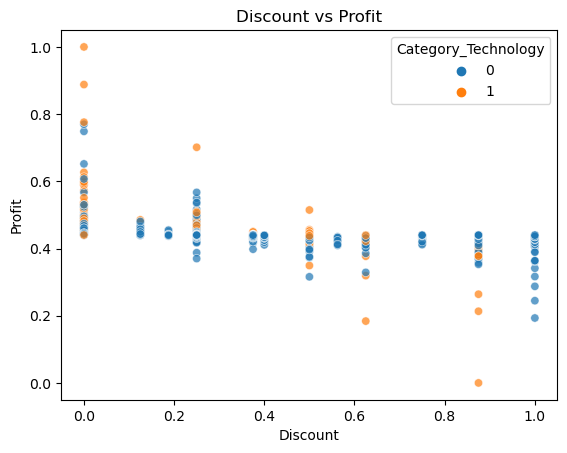

In [38]:
sns.scatterplot(data=df, x='Discount', y='Profit', hue='Category_Technology', alpha=0.7)
plt.title("Discount vs Profit")
plt.show()


**Inverse Relationship Between Discount and Profit:**

- As discounts increase, profits tend to decrease significantly.
  - Highlights the negative impact of high discounts on profitability.

---

**Category-Specific Impact:**

- Both **Technology** (orange points) and other categories (blue points) show a similar trend.
  - **Technology** appears to maintain slightly better profit levels at higher discounts compared to other categories.

---

**Profit Maximization at Lower Discounts:**

- Most high-profit transactions occur at minimal discounts.
  - Reinforces the need to limit discounting to sustain profitability.

---

**Conclusion:**

- Minimize discounts across all categories, particularly for non-Technology items, to protect profit margins.
- Use selective discounting strategies for **Technology** items, as they appear more resilient to profitability loss.


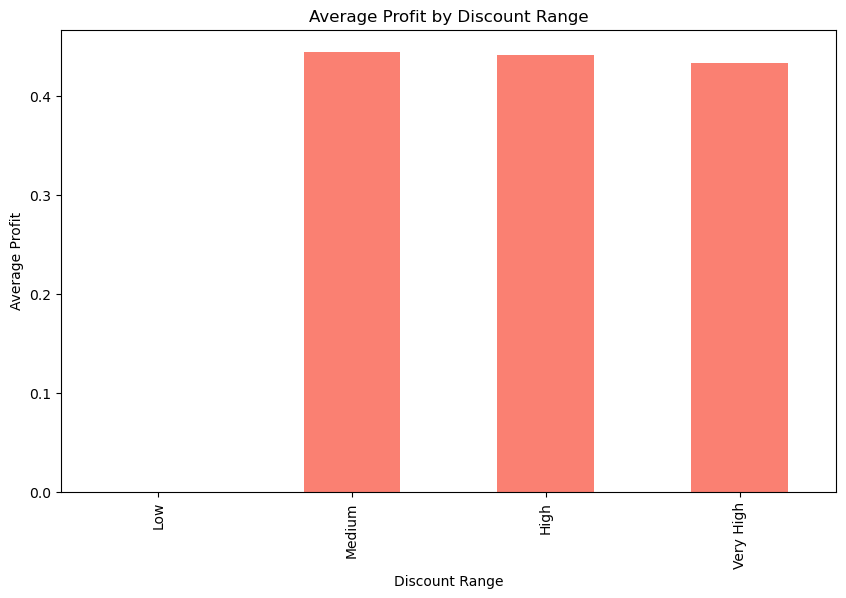

In [39]:
#Grouped Analysis by Discount
df['Discount Range'] = pd.cut(df['Discount'], bins=[0, 0.1, 0.2, 0.3, 1], labels=['Low', 'Medium', 'High', 'Very High'])
discount_analysis = df.groupby('Discount Range')['Profit'].mean()

discount_analysis.plot(kind='bar', figsize=(10, 6), color='salmon', title="Average Profit by Discount Range")
plt.ylabel("Average Profit")
plt.show()


**Average Profit Across Discount Ranges:**

- Surprisingly, the average profit remains consistent across **Medium**, **High**, and **Very High** discount ranges.
  - Indicates that despite higher discounts, profitability is not significantly affected due to potentially higher sales volume.

---

**No Data for Low Discounts:**

- Absence of data for low discounts suggests limited or no transactions in this category.
  - May point to a focus on higher discount strategies.

---

**Conclusion:**

- While profitability appears stable across discount ranges, further analysis is needed to understand whether increased sales volumes compensate for the impact of high discounts.
- Introduce **low-discount strategies** to test if profits can be enhanced further.

## Bubble plot of sales vs profit with the bubble size based on discount

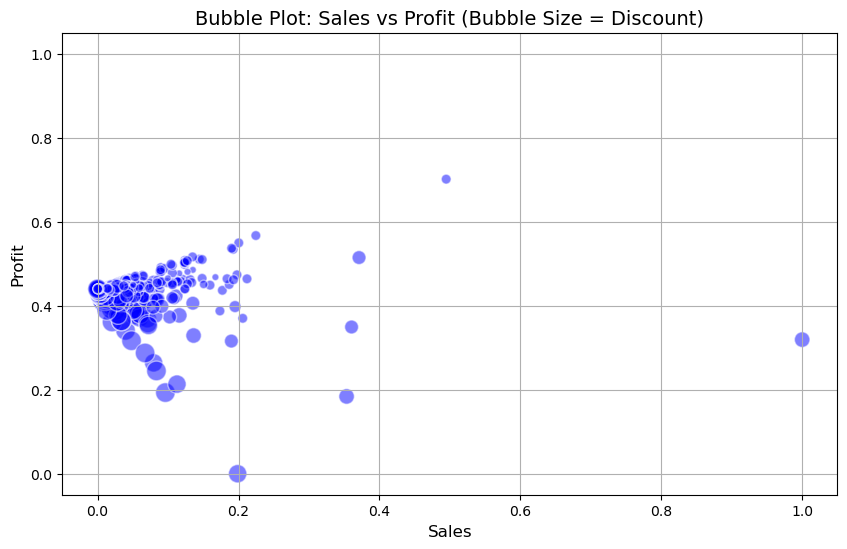

In [40]:
# Bubble plot
plt.figure(figsize=(10, 6))
plt.scatter(df['Sales'], df['Profit'], s=df['Discount']*200, alpha=0.5, c='blue', edgecolors='w')
plt.title('Bubble Plot: Sales vs Profit (Bubble Size = Discount)', fontsize=14)
plt.xlabel('Sales', fontsize=12)
plt.ylabel('Profit', fontsize=12)
plt.grid(True)
plt.show()


**Sales vs. Profit Relationship:**

- There is a positive correlation between **Sales** and **Profit**.
  - As sales increase, profit tends to rise.
- Most transactions cluster at lower sales and profit levels.
  - Indicates smaller-value transactions dominate.

---

**Impact of Discounts:**

- Larger bubbles (representing higher discounts) are spread across varying sales levels.
  - Less frequent at very high profit levels.
  - High discounts may drive sales but do not consistently result in high profits.

---

**High-Value Transactions:**

- A few outliers with high sales and profit exist.
  - Represent high-value transactions that contribute disproportionately to overall profitability.

---

**Conclusion:**

- Focus on maintaining the balance between discounting and profitability.
- Efforts should be made to increase the frequency of high-value transactions.
- Manage discount strategies effectively to sustain profit margins.

## Sales vs Quantity (Bubble Size = Profit)

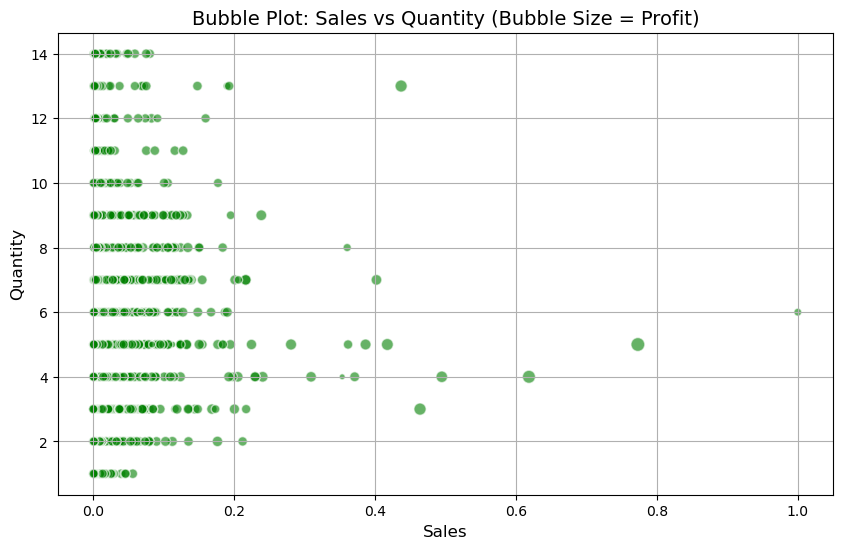

In [41]:
plt.figure(figsize=(10, 6))
plt.scatter(df['Sales'], df['Quantity'], s=df['Profit']*100, alpha=0.6, c='green', edgecolors='w')
plt.title('Bubble Plot: Sales vs Quantity (Bubble Size = Profit)', fontsize=14)
plt.xlabel('Sales', fontsize=12)
plt.ylabel('Quantity', fontsize=12)
plt.grid(True)
plt.show()


**Sales vs. Profit Relationship:**

- There is a positive correlation between **Sales** and **Profit**.
  - As sales increase, profit tends to rise.
- Most transactions cluster at lower sales and profit levels.
  - Indicates smaller-value transactions dominate.

**Impact of Discounts:**

- Larger bubbles (representing higher discounts) are spread across varying sales levels.
  - Less frequent at very high profit levels.
  - High discounts may drive sales but do not consistently result in high profits.

**High-Value Transactions:**

- A few outliers with high sales and profit exist.
  - Represent high-value transactions contributing disproportionately to overall profitability.

**Conclusion:**

- Focus on maintaining the balance between discounting and profitability.
- Efforts should be made to increase the frequency of high-value transactions while managing discount strategies to sustain profit margins.

---

**Sales vs. Quantity Relationship:**

- There is no strong correlation between **Sales** and **Quantity**.
  - Higher quantities are not consistently linked with higher sales values.
- Most transactions are concentrated in lower sales and quantity ranges.

**Profit Distribution:**

- Larger bubbles (indicating higher profit) are present across a range of sales and quantities.
  - Profitability is not strictly dependent on either factor.
- Transactions with higher sales values tend to show moderate profit, irrespective of the quantity sold.

**Outliers:**

- Few outliers exist with high sales or high quantities.
  - Represent exceptional transactions that may require further investigation for insights.

**Conclusion:**

- Focus on optimizing product pricing strategies to enhance sales profitability across different quantity ranges.
- Examine high-quantity transactions with lower sales to identify potential inefficiencies or opportunities.


## Top Products

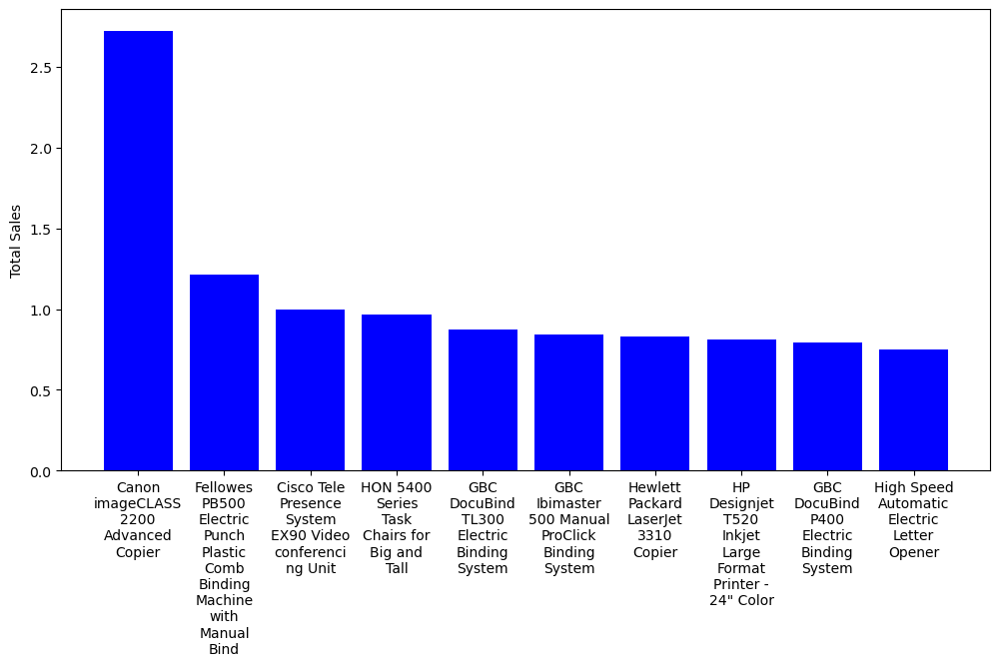

In [83]:
top_products = df.groupby('Product Name')['Sales'].sum().sort_values(ascending=False).head(10)

wrapped_labels = wrap_labels(top_products.index, width=10)

# Plotting
plt.figure(figsize=(12, 6))
plt.bar(wrapped_labels, top_products, color='blue')
plt.ylabel("Total Sales")
plt.show()


**Top Product Performance:**

- The **Canon imageCLASS 2200 Advanced Copier** significantly outperforms other products in total sales.
  - Makes it a top contributor to revenue.

---

**Diverse Product Contributions:**

- Other products like **binding machines**, **video conferencing units**, and **chairs** contribute steadily to sales.
  - However, their sales figures are considerably lower than the Canon Copier.

---

**Revenue Dependency:**

- Sales distribution suggests a reliance on a few high-performing products for a significant portion of revenue.

---

**Conclusion:**

- Focus on maintaining and enhancing the performance of top-selling products like the **Canon Copier**.
- Identify strategies to boost sales for mid-tier products.
- Diversify revenue streams by promoting less popular items through targeted marketing and bundling offers.

## Pie Chart: Sales by Region

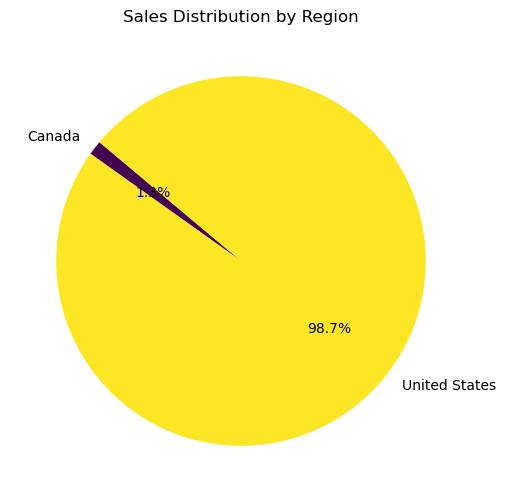

In [43]:
# Group data by Region and sum sales
region_sales = df.groupby('Country/Region')['Sales'].sum()

# Plot pie chart
plt.figure(figsize=(8, 6))
region_sales.plot(kind='pie', autopct='%1.1f%%', startangle=140, colormap='viridis')
plt.title('Sales Distribution by Region')
plt.ylabel('')  # Remove y-axis label
plt.show()


**Dominance of the United States:**

- The United States accounts for an overwhelming **98.7%** of total sales.
  - Highlights its primary role in the business's revenue generation.

---

**Limited Contribution from Canada:**

- Canada contributes only **1.3%** to sales.
  - Indicates a significantly smaller market presence or focus in this region.

---

**Conclusion:**

- The data suggests a heavy dependence on the **U.S. market**.
- To mitigate risks and explore growth opportunities:
  - Direct efforts toward expanding operations, marketing, and customer engagement in **Canada** or other international regions.

## Pie Chart: Discount Range Distribution

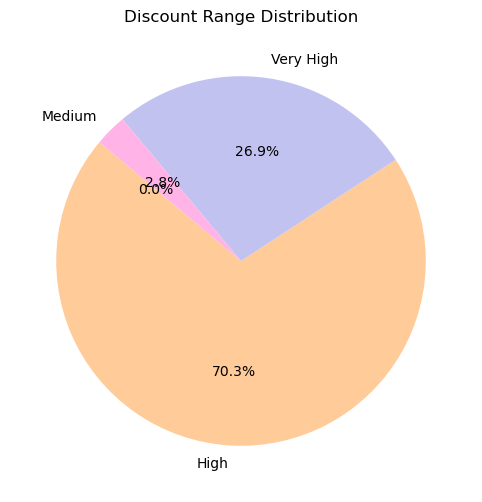

In [44]:
# Count values in Discount Range
discount_distribution = df['Discount Range'].value_counts()

# Plot pie chart
plt.figure(figsize=(8, 6))
discount_distribution.plot(kind='pie', autopct='%1.1f%%', startangle=140, colors=['#ffcc99', '#c2c2f0', '#ffb3e6', '#c2f0c2'])
plt.title('Discount Range Distribution')
plt.ylabel('')
plt.show()


**High Discounts Dominate:**

- A significant majority (**70.3%**) of transactions fall under the **high discount** range.
  - Indicates a focus on aggressive pricing strategies to drive sales.

---

**Moderate Contribution from Very High Discounts:**

- **26.9%** of transactions are in the **very high discount** category.
  - Possibly targeting clearance or promotional sales.

---

**Negligible Medium and Low Discounts:**

- **Medium discounts** account for **2.8%**.
- **Low discounts** are practically absent (**0.0%**).
  - Suggests the business rarely opts for minimal discounts.

---

**Conclusion:**

- The reliance on **high** and **very high discounts** might indicate dependency on promotional pricing to attract customers.
- While effective for driving sales volume, this strategy could impact:
  - **Profit margins**
  - **Brand perception**
- Balancing discount levels with profitability metrics may be essential.

## Pie Chart: Segment Corporate Distribution 

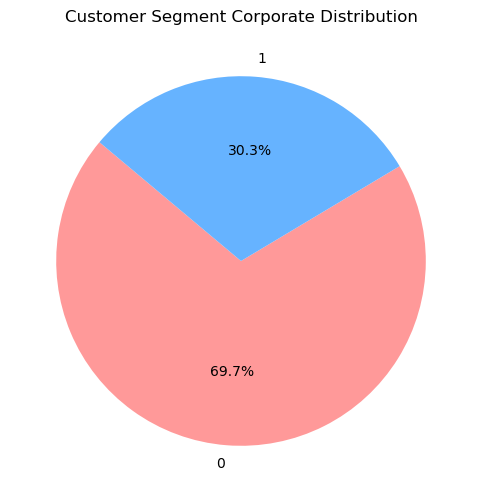

In [45]:
# Count values in Segment
segment_distribution = df['Segment_Corporate'].value_counts()

# Plot pie chart
plt.figure(figsize=(8, 6))
segment_distribution.plot(kind='pie', autopct='%1.1f%%', startangle=140, colors=['#ff9999','#66b3ff','#99ff99'])
plt.title('Customer Segment Corporate Distribution')
plt.ylabel('')
plt.show()


**Corporate Segment Contribution:**

- Only **30.3%** of customers belong to the **Corporate segment**.
  - Indicates a smaller focus on business-related clients.

---

**Non-Corporate Dominance:**

- The majority (**69.7%**) of transactions come from non-corporate customers.
  - Likely from the **retail** or **home office** segments.

---

**Conclusion:**

- While corporate customers represent a smaller portion, they may hold higher-value potential.
- Strategies could involve:
  - Targeted marketing for **corporate clients** to increase their share.
  - Retaining the strong **non-corporate** base to ensure balanced growth.

## Pie Chart: Segment Home Office Corporate Distribution 

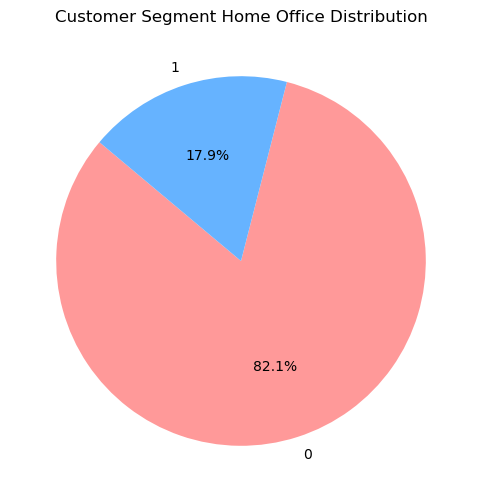

In [46]:
# Count values in Segment
segment_distribution = df['Segment_Home Office'].value_counts()

# Plot pie chart
plt.figure(figsize=(8, 6))
segment_distribution.plot(kind='pie', autopct='%1.1f%%', startangle=140, colors=['#ff9999','#66b3ff','#99ff99'])
plt.title('Customer Segment Home Office Distribution')
plt.ylabel('')
plt.show()


**Home Office Segment Contribution**

- Only **17.9%** of the transactions are from the **Home Office segment**.
  - Indicates this is a smaller target group.

**Non-Home Office Dominance**

- The majority (**82.1%**) of transactions come from **non-home office segments**.
  - Suggests a focus on other customer types, such as **corporate** or **general retail**.

**Conclusion**

- The **Home Office segment** has a relatively smaller presence.
- Strategies could include:
  - Exploring **targeted promotions** or **product bundling** specifically designed for **home office users**.
  - Aim to increase engagement and market share within this segment.

## Plots using plotly for interactivity

In [47]:
# Grouping Sales and Profit by Region
regional_data = df.groupby(['Country/Region'])[["Sales", "Profit"]].sum().reset_index()

# Create an interactive bar chart
fig = px.bar(regional_data, x="Country/Region", y=["Sales", "Profit"], 
             title="Regional Sales and Profit (Interactive)",
             barmode="group",
             labels={"value": "Value", "Region": "Country/Region"},
             color_discrete_sequence=px.colors.qualitative.Set2)
fig.show()


In [48]:
# Group Sales by Year and Month
monthly_sales = df.groupby(["Order Year", "Order Month"])["Sales"].sum().reset_index()

# Interactive line chart
fig = px.line(monthly_sales, x="Order Month", y="Sales", color="Order Year",
              title="Interactive Monthly Sales Trend",
              labels={"Order Month": "Month", "Sales": "Total Sales", "Order Year": "Year"},
              markers=True)
fig.show()


In [49]:
fig = px.scatter(df, x="Discount", y="Profit", color="Category_Technology",
                 title="Interactive Discount vs Profit",
                 labels={"Discount": "Discount", "Profit": "Profit", "Category_Technology": "Technology Category"},
                 hover_data=["Product Name"])
fig.show()


In [50]:
import plotly.figure_factory as ff

# Calculate Correlation Matrix
correlation_matrix = df.select_dtypes(include=["float64", "int64"]).corr()

# Create an interactive heatmap
fig = ff.create_annotated_heatmap(
    z=correlation_matrix.to_numpy(),
    x=correlation_matrix.columns.tolist(),
    y=correlation_matrix.columns.tolist(),
    colorscale="Viridis",
    showscale=True,
    annotation_text=correlation_matrix.round(2).astype(str).to_numpy(),  # Add rounded annotations
)

# Update layout to enhance visualization
fig.update_layout(
    title="Interactive Correlation Heatmap",
    xaxis_title="Features",
    yaxis_title="Features",
    xaxis=dict(tickangle=-45),  # Rotate x-axis labels for better visibility
    width=1000,  # Increase width
    height=800,  # Increase height
    font=dict(size=12),  # Increase font size
    margin=dict(l=100, r=100, t=100, b=100)  # Add margins for better spacing
)

# Display the figure
fig.show()


### Bubble plot with plotly

In [51]:
import plotly.express as px

# Create interactive bubble plot
fig = px.scatter(df, x='Sales', y='Profit',
                 size='Discount',  # Bubble size
                 color='Category_Technology',  # Color based on category
                 hover_name='Product Name',  # Display product name on hover
                 title='Bubble Plot: Sales vs Profit (Bubble Size = Discount)',
                 labels={'Sales': 'Sales', 'Profit': 'Profit'},
                 opacity=0.6)
fig.show()


## Interactive Bubble Plot by Region (Plotly)

In [52]:
fig = px.scatter(df, x='Profit', y='Quantity',
                 size='Sales',  # Bubble size
                 color='Country/Region',  # Color by region
                 hover_name='State/Province',  # Hover details
                 title='Bubble Plot: Profit vs Quantity (Bubble Size = Sales, Colored by Region)',
                 labels={'Profit': 'Profit', 'Quantity': 'Quantity'})
fig.show()


**Profit vs. Quantity Relationship**

- Higher profit values are generally associated with **smaller quantities**.
  - Suggests that **premium products** with high profit margins are sold in lower quantities.

**Regional Differences**

- Most data points are concentrated in the **United States**.
  - Reflects the higher dominance of the **U.S. market** compared to **Canada** in both quantity and sales.

**Sales Contribution**

- Bubble sizes, representing sales, are mostly **moderate**.
  - Very few instances show **large sales volumes** corresponding to high profits.

**Conclusion**

- To enhance profitability:
  - Focus on scaling the sales of **premium products**.
  - Improve the profit margins for **high-quantity items**.
- Implement strategies targeting **Canadian regions** to balance regional contributions.

## Top 10 products

In [96]:
import plotly.express as px

# Group Sales by Product Name and sort
top_products = df.groupby("Product Name")["Sales"].sum().sort_values(ascending=False).head(10).reset_index()

# Interactive bar chart
fig = px.bar(
    top_products,
    x="Product Name",
    y="Sales",
    title="Top 10 Products by Sales (Interactive)",
    labels={"Product Name": "Product", "Sales": "Total Sales"},
    color="Sales",
    color_continuous_scale="Blues"
)

# Improve layout and visibility
fig.update_layout(
    title=dict(text="Top 10 Products by Sales (Interactive)", font=dict(size=24)),
    xaxis=dict(
        title="Product",
        titlefont_size=16,
        tickangle=45,  # Rotate product names for better visibility
        tickfont_size=12,
    ),
    yaxis=dict(
        title="Total Sales",
        titlefont_size=16,
        tickfont_size=12,
    ),
    width=900,  # Adjust chart width
    height=600,  # Adjust chart height
    margin=dict(l=100, r=50, t=100, b=150),  # Add spacing for better visualization
)

# Add hover template for cleaner tooltips
fig.update_traces(hovertemplate="<b>%{x}</b><br>Total Sales: %{y:,.2f}<extra></extra>")

# Display the chart
fig.show()


## Feature Engineering

In [54]:
# Flag products with high profits
df['High Profit Product'] = df['Profit'] > 10
# Flag loss-making transactions
df['Loss Transaction'] = df['Profit'] < 0


In [55]:
# Create discount ranges
df['Discount Range'] = pd.cut(df['Discount'], 
                               bins=[0, 0.1, 0.2, 0.3, 1], 
                               labels=['Low', 'Medium', 'High', 'Very High'])


In [56]:
# Create a season column
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Fall'

df['Season'] = df['Order Month'].apply(get_season)


In [57]:
# Flag fast shipments
df['Fast Shipping'] = df['Shipping Duration'] < 2


In [58]:
# Calculate total sales per customer
df['Customer Lifetime Value'] = df.groupby('Customer ID')['Sales'].transform('sum')


In [59]:
# Calculate region-wise profit categories
region_profit = df.groupby('Country/Region')['Profit'].sum()
df['Region Profit Category'] = df['Country/Region'].map(lambda x: 'High' if region_profit[x] > 50 else 'Low')


In [60]:
# Calculate adjusted profit margin
df['Discount Adjusted Margin'] = df['Profit Margin'] - df['Discount']

# Sales per quantity sold
df['Sales Per Unit'] = df['Sales'] / df['Quantity']


## EDA for feature engineered new features

In [61]:
df[['High Profit Product', 'Loss Transaction', 'Customer Lifetime Value', 'Discount Adjusted Margin']].describe()


,Customer Lifetime Value,Discount Adjusted Margin
count,10194.000000,10194.000000
mean,0.161079,0.689529
std,0.126932,0.388218
min,0.000174,-1.000000
25%,0.074003,0.623077
50%,0.128300,0.711538
75%,0.209506,0.947692
max,1.105944,1.000000


**Customer Lifetime Value (CLV)**

- **Mean**: The average CLV is relatively low at **0.161**, indicating that most customers have modest spending over their lifetime.
- **Range**: CLV ranges from a minimum of **0.000174** to a maximum of **1.105944**, showcasing significant variability.
- **Distribution**: 
  - **75%** of customers have a CLV below **0.2095**.
  - Suggests only a small fraction of customers contribute significantly to lifetime value.

**Discount Adjusted Margin**

- **Mean and Spread**: 
  - The mean adjusted margin is **0.689** with a standard deviation of **0.388**.
  - Shows a concentration towards higher values but with some variability.
- **Range**: Values range from **-1.0** to **1.0**.
  - Reflects cases with potential losses or high profit margins.
- **Quartiles**: 
  - A majority (**75%**) have a discount-adjusted margin above **0.623**, indicating consistent profitability after discounts.

**Conclusion**

- The data indicates a **skewed customer base**, where a small proportion of customers drive high value and profit.
- Strategies to:
  - Nurture **high-CLV customers**.
  - Address **low-margin cases** to further optimize profitability.


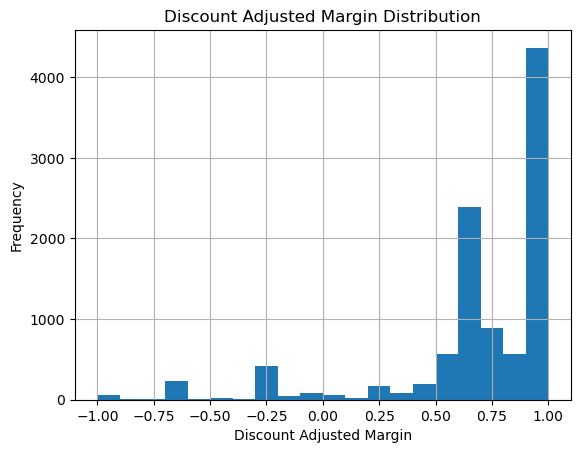

In [62]:
df['Discount Adjusted Margin'].hist(bins=20)
plt.title('Discount Adjusted Margin Distribution')
plt.xlabel('Discount Adjusted Margin')
plt.ylabel('Frequency')
plt.show()


**Distribution Characteristics**

- The **Discount Adjusted Margin** exhibits a highly **skewed distribution**.
  - Strong concentration near the upper limit (**0.75–1.0**).
  - A smaller but significant number of cases fall below zero.
    - Indicates scenarios where discounts may lead to **negative profitability**.

**Profitability Trend**

- The majority of observations are **profitable**, as shown by the large frequency in higher margins.
- The presence of **negative margins** highlights the need for a review in **pricing** or **discounting strategies** to minimize losses.

**Actionable Insights**

- Focus on optimizing **discounts** for cases with negative or low margins to improve overall profitability.
- Investigate **customer segments** or **product categories** contributing to low-margin or loss-making scenarios.

This plot underscores the importance of **balancing discounts** with **profitability goals**.


In [63]:
df[['Profit', 'Discount Adjusted Margin', 'Sales Per Unit']].corr()


,Profit,Discount Adjusted Margin,Sales Per Unit
Profit,1.000000,0.227606,0.470561
Discount Adjusted Margin,0.227606,1.000000,0.023655
Sales Per Unit,0.470561,0.023655,1.000000


**Correlation Analysis**

- **Profit and Discount Adjusted Margin** show a **moderate positive correlation** (0.2276).
  - Suggests that higher margins tend to slightly align with higher profits.
- **Sales Per Unit** is moderately correlated with **Profit** (0.4706).
  - Indicates that increasing the unit price could have a significant impact on profitability.

**Weak Correlations**

- **Sales Per Unit** has a negligible correlation (0.0237) with the **Discount Adjusted Margin**.
  - Shows that adjusted margins do not significantly affect the per-unit sales price.

**Actionable Insights**

- Leverage strategies to **increase Sales Per Unit** as it has a stronger impact on profitability.
- Focus on aligning **discount strategies** to improve the **Discount Adjusted Margin**, thereby strengthening its relationship with profit.

This correlation matrix highlights areas of improvement in **pricing** and **discount strategies** to enhance profitability.


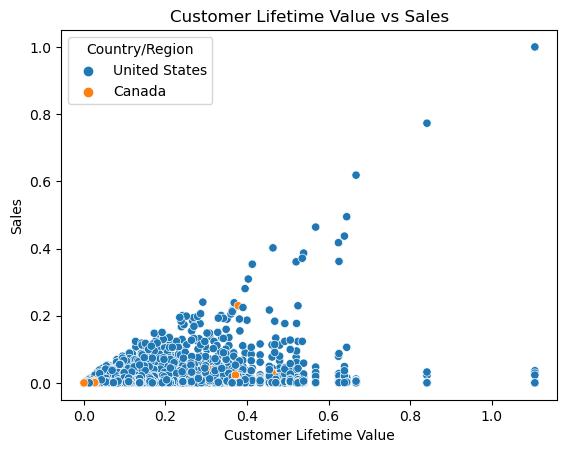

In [64]:
sns.scatterplot(data=df, x='Customer Lifetime Value', y='Sales', hue='Country/Region')
plt.title('Customer Lifetime Value vs Sales')
plt.show()


**Positive Relationship**

- The scatterplot illustrates a **positive relationship** between **Customer Lifetime Value (CLV)** and **Sales**.
  - Higher CLV generally corresponds to increased sales.

**Regional Comparison**

- The **United States** dominates in the number of customers and sales.
  - Represented by the high density of **blue dots**.
- **Canada** has a minimal contribution to sales.
  - Depicted by the sparse **orange dots**.

**Outliers**

- A few points represent significantly higher sales for customers with higher CLV.
  - Suggest potential **high-value customers** who drive major revenue.

**Actionable Insight**

- Focus on **retaining high CLV customers** and implementing upselling or cross-selling strategies to maximize their sales contributions.
- Explore strategies to **increase CLV for Canadian customers** to boost regional sales.


## Geoplot

In [65]:
#Aggregate sales by State/Province
state_sales = df.groupby('State/Province')['Sales'].sum().reset_index()

city_state_data = df[['City', 'State/Province']].drop_duplicates()

# Merge both datasets on 'State/Province'
merged_data = city_state_data.merge(state_sales, on='State/Province', how='inner')

# Check the merged data
print(merged_data.head())


         City State/Province     Sales
0     Houston          Texas  7.498473
1  Huntsville          Texas  7.498473
2      Laredo          Texas  7.498473
3      Dallas          Texas  7.498473
4     Lubbock          Texas  7.498473


In [66]:
fig = px.scatter_geo(df, 
                     locations='Country/Region', 
                     locationmode='country names', 
                     size='Sales', 
                     hover_name='City', 
                     title='Sales by Country and City', 
                     scope='world')
fig.show()


**Concentration of Sales**
**Key Insights:**

- The map highlights that the majority of sales activity is concentrated in the **United States**, particularly in certain cities.
  - Represented by prominent **blue circles**.

**Regional Focus:**

- Sales are clustered in specific geographic areas.
  - Indicates a strong customer base in these cities.
  - These regions could benefit from targeted marketing and operational strategies.

**Global Distribution:**

- There is an absence of significant representation outside the **U.S.**.
  - Emphasizes the need to explore **international market opportunities** to diversify revenue streams.

---

**Actionable Insight:**

- **Maintain and expand operations** in high-sales cities.
- Explore potential growth in **less represented areas**.
- Develop strategies to tap into **international markets** for revenue diversification.


# FINAL ANALYSIS

## **Sales and Profit Insights**

### **1. Sales and Profit Trends**

- The monthly sales trend over the years (2018–2021) depicts an **upward trend towards Q4**.
  - Likely due to seasonal trends such as holiday or end-of-year deals.
- Regional analysis shows:
  - **East** and **West** regions contribute significantly to high sales and profit.
  - **South** remains comparatively weak.

### **Product Category Performance**

- **Office Supplies** dominate in sales.
- **Technology** leads in profit despite lower sales.
  - Indicates higher return on investment per product sold.

### **Top Products**

- The **Canon imageCLASS 2200 Advanced Copier** stands out as the market leader in sales.
  - Can be considered a flagship product.

---

## **2. Customer and Segment Insights**

### **Customer Segment Distribution**

- **Non-Corporate segment**: 69.7% of customers.
  - Represents reliance on individual consumers.
- **Corporate segment**: 30.3% of customers.
- **Home Office segment**: Smallest share at 17.9%.

### **Customer Lifetime Value (CLV)**

- **CLV vs. Quantity scatterplot**:
  - Sales quantity grows with deeper CLV, especially in the **American market**.
  - High-CLV clients should be targeted for retention.

---

## **3. Geographic Insights**

### **Regional Sales Distribution**

- The **US market** accounts for **98.7%** of sales.
- **Canada** contributes just **1.3%**.
- Sales are centralized in major urban areas.
  - Opportunity exists for expansion into **underutilized territories** in Canada and internationally.

### **State-Level Insights**

- **California**, **Texas**, and **New York** lead in sales.
  - Likely due to higher populations and commercial activity centers.

---

## **4. Discount and Profit Insights**

### **Discount vs. Profit**

- High discounts are often associated with **low profit margins**.
- Products with markdowns over 20% are less profitable.
  - Highlights the need to rationalize discounting policies.

### **Discount Ranges**

- **70%** of discounts are classified as high.
- Low and medium discounts are minimal.

---

## **5. Shipping and Operations**

### **Shipping Duration Analysis**

- Average shipping duration ranges from **0.3 to 0.4 days**.
  - Indicates efficient logistics.
- Some months, particularly at year-end, show longer durations.
  - Likely due to high order volumes.

### **Monthly Shipping Duration**

- Planning for peak sales periods could reduce delays.

---

## **6. Sub-Category Product Performance**

### **Top Sub-Categories**

- **Chairs**, **Phones**, and **Storage** lead in sales.
  - Should receive strategic focus for continued growth.
- **Binders** and **Copiers** show steady demand.

### **Lagging Sub-Categories**

- **Fasteners**, **Labels**, and **Art Supplies** generate low revenue.
  - Suggestive of configuration or elimination opportunities.

---

## **7. Correlation Analysis**

### **Key Correlations**

- **Sales vs. Profit**:
  - Correlation coefficient: **0.48**.
  - Higher sales are associated with higher profit levels.
- **Discount vs. Profit Margin**:
  - Negative correlation: **-0.86**.
  - High discounts reduce profit margins.

### **Actionable Insight**

- Focus on minimizing over-discounting while maximizing competitive margins.

---

## **8. Visual Insights and Metrics Positioning**

### **Boxplots for Outliers**

- Highlight large discrepancies in sales and profit margin data.
  - Driven by a few high-value transactions.
  - These require targeted marketing or loyalty campaigns.

### **Histograms**

- Sales and profit distributions are **negatively skewed**.
  - Indicate high frequency of small transactions compared to big-ticket ones.

---

## **Final Recommendations**

### **Geographic Expansion**

- Increase sales in underperforming areas, such as **Canada**.
- Explore globalization to diversify revenue streams.

### **Product Strategy**

- Focus on **high-margin products** like **Technology**.
- Assess performance of low-margin subcategories like **Art Supplies**.

### **Customer Retention**

- Target high-CLV clients with special loyalty programs to enhance spending.

### **Discount Optimization**

- Reduce frequent couponing to protect profit margins.
- Implement a **tiered discounting system** based on customer differentiation.

### **Operational Efficiency**

- Address logistical flaws to reduce shipping delays during peak sales periods.

### **Marketing Focus**

- Increase advertising and product mix adjustments for high-demand categories like **Chairs** and **Phones**.
  - Ensure profitability in high-risk categories such as **Technology**.
